# Built-In Alpha Factor Analysis
____________________________
## Short Term Mean Reversion Factor
___________________________

This notebook will demonstrate the use of Quantopian's Pipeline API and Alphalens library to analyze a built-in factor based on cross-sectional returns of stocks in the Q500US Universe. 

### Q500US Univeerse
The Q500US universe is built-in filter in the Quantopian platform designed to be used with the Pipeline API. The idea is to filter for the most "tradeable" stocks in order to reduce liquidity risk, i.e. the risk that your order would not be filled (or will be filled with significant slippage) in live trading.

This will be particularly important in this example, which will have relatively high turnover.

### Short-Term Mean Reversion Factor
We will test a simple factor based on mean reversion. The idea is that stocks which have performed the best (or worst) over a short time period are likely to mean revert and underperform (ourperform) over subsequent trading days due to an overreaction to new information by market participants. 

Below are a couple of old papers that study this effect. 

##### Weekly Mean Reversion Effect
Lehmann, B. N. (1990) Fads, Martingales, and Market Efficiency. Quarterly Journal of Economics, 105(1), 1-28. doi:10.2307/2937816

##### Monthly Mean Reversion Effect
Jegadeesh, N. (1990). Evidence of Predictable Behavior of Security Returns. The Journal of Finance, 45(3), 881-898. doi:10.2307/2328797

## 1) Import the necessary modules, classes, factors, filters, and data

In [1]:
# Typical imports for use with Pipeline
from quantopian.pipeline import Pipeline
from quantopian.research import run_pipeline

# Datasets
from quantopian.pipeline.data.builtin import USEquityPricing

# Factors, Classifiers, and Filters
from quantopian.pipeline.factors import AverageDollarVolume, Returns
from quantopian.pipeline.classifiers.morningstar import Sector
from quantopian.pipeline.filters.morningstar import Q500US

# Import Alphalens for Factor Analysis
import alphalens as al

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## 2) Create Pipeline Instance

In [2]:
def make_pipeline():
    """Create a pipeline instance"""
    # Base Universe
    base_universe = Q500US()
    
    # Additional Filter Example:
    # Avg Dollar Volume must be greater than 20 million:
    # dollar_volume_filter = AverageDollarVolume(window_length=65) > 20e6
    
    # Combine Filters into your universe
    universe = base_universe #& dollar_volume_filter
    
    # Calculate Return Factors
    return_5 = Returns(inputs=[USEquityPricing.close], 
                       window_length=6,
                       mask=universe)
    
    return_21 = Returns(inputs=[USEquityPricing.close], 
                        window_length=22,
                        mask=universe)
    
    rank_5 = return_5.rank(method='average', ascending=False, mask=universe)
    rank_21 = return_21.rank(method='average', ascending=False, mask=universe)
    
    return Pipeline(columns={'Return_5': return_5,
                             'Return_21': return_21,
                             'Rank_5': rank_5,
                             'Rank_21': rank_21,
                             'sector_code': Sector()
                            },
                    screen=universe)

### 2.5) Test the pipeline on a small portion of data.

In [3]:
start_date = '2016-10-04' 
end_date = '2017-01-05'

result = run_pipeline(make_pipeline(), start_date, end_date)  

In [4]:
result.head()

Rank_21  Rank_5  Return_21  \
2016-10-04 00:00:00+00:00 Equity(2 [ARNC])     231.5    71.0   0.000000   
                          Equity(24 [AAPL])     70.0   340.0   0.054205   
                          Equity(62 [ABT])     199.0   176.0   0.005912   
                          Equity(67 [ADSK])     64.0   298.0   0.056710   
                          Equity(76 [TAP])      60.0    79.0   0.060402   

                                             Return_5  sector_code  
2016-10-04 00:00:00+00:00 Equity(2 [ARNC])   0.045947          101  
                          Equity(24 [AAPL]) -0.003190          311  
                          Equity(62 [ABT])   0.020389          206  
                          Equity(67 [ADSK])  0.001548          311  
                          Equity(76 [TAP])   0.042298          205

## 3) Run the pipeline in chunks over the full testing period. 

We run in chunks to avoid memory overload if the whole time period was run at once. 

In [5]:
def run_pipe_in_chunks(pipe, start_date, end_date, 
                       weeks = 25, days = 0):
    """Run pipeline in chunks to avoid memory overload
    --------
    Inputs:
    --------
    pipe: pipeline object
    start_date: string, Timestamp, or datetime object
        a date string or datetime object representing the start of the period
    end_date: string, Timestamp, or datetime object
        a date string or datetime object representing the end of the period
    weeks, days: int
        number of weeks and/or days in each chunk
    
    -------
    Return
    --------
    a multi-index dataframe:
         Index=(Date, asset)
         Columns = pipeline columns
    """
    import datetime as dt
    
    # Convert start and end_date to timestamp
    start_date = pd.Timestamp(start_date)
    end_date = pd.Timestamp(end_date)
    
    # Set inital chunk date endpoints
    start = start_date
    step = pd.Timedelta(weeks = weeks, days = days)
    end = start + step
    
    # Initialize a list named chunks to store the pipeline results
    chunks  = []
    while start < end_date:
        # Run pipeline and append to chunks
        print "Running Pipeline for %s to %s" % (start, end)
        result = run_pipeline(pipe, start_date= start, end_date= end)
        chunks.append(result)
        
        # Update start and end dates
        end = result.index.get_level_values(0)[-1].tz_localize(None)
        start = end + pd.Timedelta(days = 1)
        end = start + step
        
        # If end is after last day of period, set to last day of period
        if end > end_date:
            end = end_date
    
    try:
        final_result = pd.concat(chunks, axis = 0)
        print "Pipeline Computations Complete"
    except:
        print 'Concat Failed: Returned List of Dataframes instead of one Dataframe'
        final_result = chunks
        
    return final_result

start_date = '2003-01-01' 
end_date = '2012-01-01'

# Run Pipeline in chunks
result = run_pipe_in_chunks(make_pipeline(), 
                            start_date, 
                            end_date, 
                            weeks=26, days=0)
  
  

Running Pipeline for 2003-01-01 00:00:00 to 2003-07-02 00:00:00
Running Pipeline for 2003-07-03 00:00:00 to 2004-01-01 00:00:00
Running Pipeline for 2004-01-03 00:00:00 to 2004-07-03 00:00:00
Running Pipeline for 2004-07-07 00:00:00 to 2005-01-05 00:00:00
Running Pipeline for 2005-01-06 00:00:00 to 2005-07-07 00:00:00
Running Pipeline for 2005-07-08 00:00:00 to 2006-01-06 00:00:00
Running Pipeline for 2006-01-07 00:00:00 to 2006-07-08 00:00:00
Running Pipeline for 2006-07-11 00:00:00 to 2007-01-09 00:00:00
Running Pipeline for 2007-01-10 00:00:00 to 2007-07-11 00:00:00
Running Pipeline for 2007-07-12 00:00:00 to 2008-01-10 00:00:00
Running Pipeline for 2008-01-11 00:00:00 to 2008-07-11 00:00:00
Running Pipeline for 2008-07-12 00:00:00 to 2009-01-10 00:00:00
Running Pipeline for 2009-01-13 00:00:00 to 2009-07-14 00:00:00
Running Pipeline for 2009-07-15 00:00:00 to 2010-01-13 00:00:00
Running Pipeline for 2010-01-14 00:00:00 to 2010-07-15 00:00:00
Running Pipeline for 2010-07-16 00:00:00

In [6]:
result.head()

Rank_21  Rank_5  Return_21  \
2003-01-02 00:00:00+00:00 Equity(2 [ARNC])     354.0   337.0  -0.107059   
                          Equity(24 [AAPL])    311.0   224.0  -0.076031   
                          Equity(60 [ABS])     228.0    44.0  -0.041237   
                          Equity(62 [ABT])     328.0    13.0  -0.086231   
                          Equity(67 [ADSK])    313.0   341.0  -0.078311   

                                             Return_5  sector_code  
2003-01-02 00:00:00+00:00 Equity(2 [ARNC])  -0.028998          101  
                          Equity(24 [AAPL]) -0.010352          311  
                          Equity(60 [ABS])   0.021510          205  
                          Equity(62 [ABT])   0.049107          206  
                          Equity(67 [ADSK]) -0.029851          311

## 4) Create Alphalens Tearsheet to analyze performance

### a) Start with the 1-week mean reversion factor

In [7]:
# Get Pricing for assets in the Pipeline DataFrame
assets = result.index.levels[1].unique()

# Set the number of additional days for which to fetch pricing data
FORWARD_DAYS = 30

# Fetch pricing data
pricing = get_pricing(assets, start_date, 
                      pd.Timestamp(end_date) + pd.Timedelta(days=FORWARD_DAYS),
                      fields="open_price")  

In [8]:
pricing.head(3)

,Equity(2 [ARNC]),Equity(24 [AAPL]),Equity(60 [ABS]),Equity(62 [ABT]),Equity(67 [ADSK]),Equity(76 [TAP]),Equity(85 [ACF]),Equity(88 [ACI]),Equity(114 [ADBE]),Equity(115 [ADCT]),...,Equity(39053 [CIT]),Equity(39546 [LYB]),Equity(39960 [MCP]),Equity(40069 [RBAK]),Equity(40353 [SODA]),Equity(40616 [MMI]),Equity(41047 [HCA]),Equity(41451 [LNKD]),Equity(41462 [MOS]),Equity(41636 [MPC])
2003-01-02 00:00:00+00:00,19.242,7.180,20.067,29.303,7.116,25.939,8.00,9.825,12.462,14.84,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-03 00:00:00+00:00,19.676,7.400,20.760,28.798,7.195,25.990,8.30,9.987,12.711,16.24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-06 00:00:00+00:00,20.010,7.515,20.822,29.000,6.992,26.658,7.96,9.942,13.134,19.18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# Morningstar sector code dicitionary to map 
# sector codes to group sector labels
MORNINGSTAR_SECTOR_CODES = {
     -1: 'Misc',
    101: 'Basic Materials',
    102: 'Consumer Cyclical',
    103: 'Financial Services',
    104: 'Real Estate',
    205: 'Consumer Defensive',
    206: 'Healthcare',
    207: 'Utilities',
    308: 'Communication Services',
    309: 'Energy',
    310: 'Industrials',
    311: 'Technology' ,    
}

In [10]:
# This "factor_data" dataframe is the key input into many of the tearsheet functions
factor_data_5a = al.utils.get_clean_factor_and_forward_returns(factor=result['Rank_5'],
                                                            prices=pricing,
                                                            groupby=result['sector_code'],
                                                            by_group=False,
                                                            groupby_labels=MORNINGSTAR_SECTOR_CODES,
                                                            quantiles=5,
                                                            periods=(1,5,10))

In [11]:
factor_data_5a

1         5  \
date                      asset                                        
2003-01-02 00:00:00+00:00 Equity(2 [ARNC])        0.022555 -0.046929   
                          Equity(24 [AAPL])       0.030641  0.018106   
                          Equity(60 [ABS])        0.034534  0.038471   
                          Equity(62 [ABT])       -0.017234 -0.016756   
                          Equity(67 [ADSK])       0.011102  0.051574   
                          Equity(76 [TAP])        0.001966  0.027063   
                          Equity(85 [ACF])        0.037500  0.093750   
                          Equity(114 [ADBE])      0.019981  0.100465   
                          Equity(122 [ADI])       0.051539  0.119622   
                          Equity(161 [AEP])       0.021736  0.101141   
                          Equity(168 [AET])       0.020692  0.027955   
                          Equity(185 [AFL])       0.032125  0.041940   
                          Equity(205 [AGN])       0.008564 -0.022139   
                          Equity(216 [HES])       0.024791  0.008647   
                          Equity(239 [AIG])       0.033563  0.041308   
                          Equity(328 [ALTR])      0.044470  0.120764   
                          Equity(337 [AMAT])      0.037886  0.125651   
                          Equity(338 [BEAM])      0.011720  0.012776   
                          Equity(351 [AMD])       0.068598  0.054878   
                          Equity(357 [TWX])       0.012174  0.055497   
                          Equity(368 [AMGN])      0.017696  0.016448   
                          Equity(430 [ANN])       0.038133  0.013025   
                          Equity(438 [AON])       0.028787  0.070699   
                          Equity(448 [APA])       0.025464 -0.019243   
                          Equity(455 [APC])       0.017879 -0.039048   
                          Equity(460 [APD])      -0.004674 -0.002351   
                          Equity(583 [AT])        0.038557  0.053836   
                          Equity(600 [OA])        0.000792 -0.003202   
                          Equity(607 [ATML])      0.038793 -0.012931   
                          Equity(630 [ADP])       0.027471  0.017560   
...                                                    ...       ...   
2012-01-03 00:00:00+00:00 Equity(34010 [COV])    -0.009794  0.007827   
                          Equity(34011 [DFS])    -0.004108  0.016845   
                          Equity(34014 [TEL])    -0.011382  0.044578   
                          Equity(34395 [LULU])    0.019789  0.262947   
                          Equity(34440 [CXO])     0.011977  0.063087   
                          Equity(34545 [VMW])    -0.036128  0.015466   
                          Equity(34661 [TDC])    -0.003423 -0.015502   
                          Equity(34913 [RF])     -0.011390  0.066059   
                          Equity(35006 [SD])     -0.034158  0.022379   
                          Equity(35114 [SFSF])   -0.002256 -0.002757   
                          Equity(35902 [PM])     -0.012759 -0.019075   
                          Equity(35920 [V])      -0.016538 -0.024468   
                          Equity(36118 [DPS])    -0.038876 -0.029345   
                          Equity(36243 [AGNC])   -0.003540  0.000708   
                          Equity(36346 [LO])     -0.017089 -0.005899   
                          Equity(36714 [RAX])    -0.023409 -0.035909   
                          Equity(36930 [DISC_A]) -0.026447  0.000000   
                          Equity(38084 [MJN])    -0.017361 -0.004028   
                          Equity(38418 [OPEN])   -0.026620  0.052737   
                          Equity(38650 [AVGO])   -0.020014  0.035278   
                          Equity(38936 [DG])     -0.014692 -0.013728   
                          Equity(39053 [CIT])    -0.006142  0.029034   
                          Equity(39546 [LYB])     0.003904  0.036637   
                         

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,1.0,103.0,50.534933,28.893984,226648,20.060026
2,100.0,202.5,150.424337,28.784561,225631,19.970014
3,198.0,302.0,250.081973,28.766447,225477,19.956384
4,297.0,401.0,349.738815,28.789190,225624,19.969394
5,396.0,500.0,449.566484,28.874781,226469,20.044183


Returns Analysis


,1,5,10
Ann. alpha,0.062,0.066,0.037
beta,0.090,0.087,0.071
Mean Period Wise Return Top Quantile (bps),4.114,20.102,23.572
Mean Period Wise Return Bottom Quantile (bps),-2.911,-16.687,-19.393
Mean Period Wise Spread (bps),7.028,7.300,4.238


/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:727: FutureWarning: pd.rolling_apply is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,min_periods=1,window=5).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:767: FutureWarning: pd.rolling_apply is deprecated for DataFrame and will be removed in a future version, replace with 
	DataFrame.rolling(center=False,min_periods=1,window=5).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:727: FutureWarning: pd.rolling_apply is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,min_periods=1,window=10).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/pl

Information Analysis


,1,5,10
IC Mean,0.011,0.025,0.019
IC Std.,0.163,0.157,0.150
t-stat(IC),3.142,7.723,6.024
p-value(IC),0.002,0.000,0.000
IC Skew,0.141,0.230,0.260
IC Kurtosis,0.661,0.710,0.388
Ann. IR,1.047,2.574,2.008


/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:215: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=22,center=False).mean()
  pd.rolling_mean(ic, 22).plot(ax=a,


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.340,0.791,0.786
Quantile 2 Mean Turnover,0.594,0.795,0.793
Quantile 3 Mean Turnover,0.637,0.781,0.782
Quantile 4 Mean Turnover,0.595,0.797,0.796
Quantile 5 Mean Turnover,0.343,0.779,0.771


,1,5,10
Mean Factor Rank Autocorrelation,0.76,-0.026,-0.006


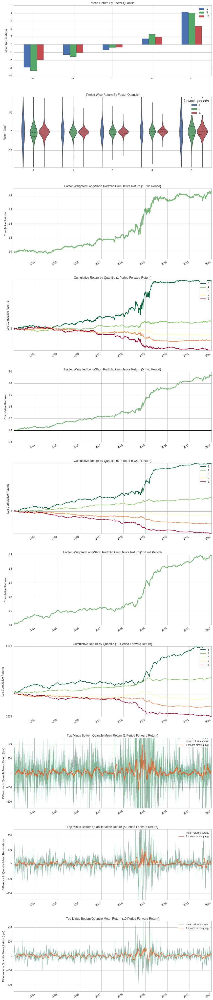

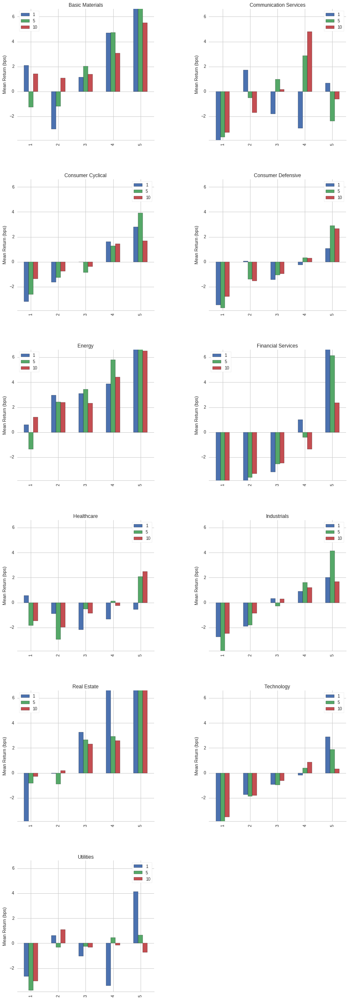

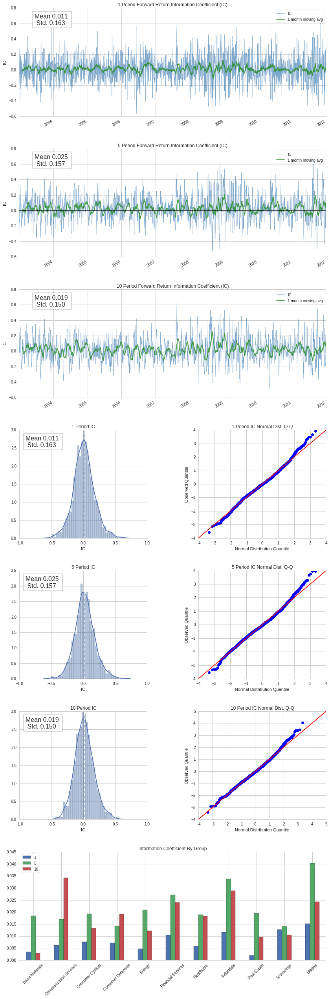

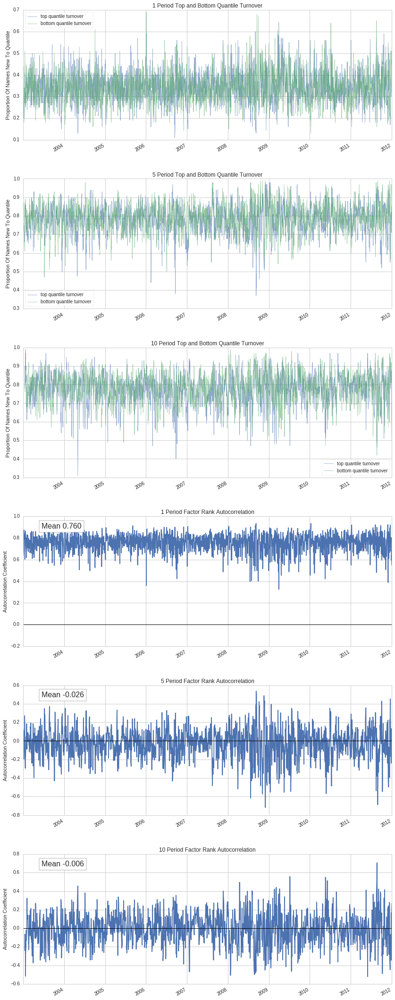

In [12]:
al.tears.create_full_tear_sheet(factor_data_5a,
                                by_group=True,
                                long_short=True)

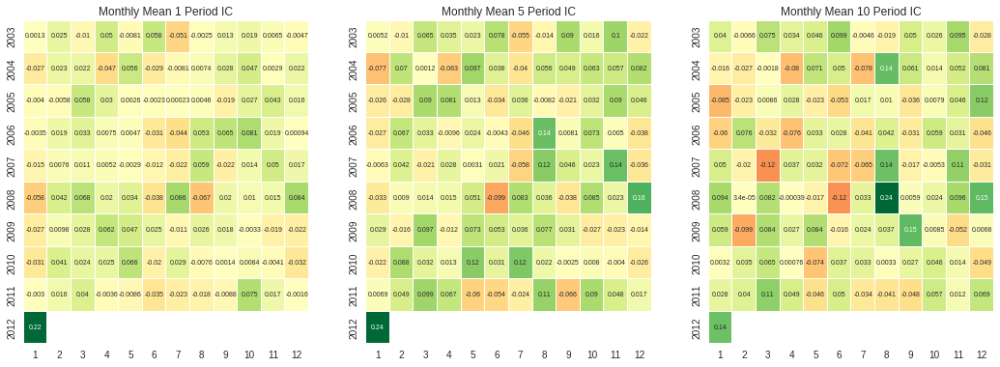

In [13]:
mean_monthly_ic = al.performance.mean_information_coefficient(factor_data_5a, by_time='M')
al.plotting.plot_monthly_ic_heatmap(mean_monthly_ic);

#### Evaluate alpha decay using the Event Tearsheet

Note: The Error bar charts show the mean return plus/minus one standard deviation. 

/usr/local/lib/python2.7/dist-packages/matplotlib/axes/_axes.py:2790: MatplotlibDeprecationWarning: Use of None object as fmt keyword argument to suppress plotting of data values is deprecated since 1.4; use the string "none" instead.
  warnings.warn(msg, mplDeprecation, stacklevel=1)


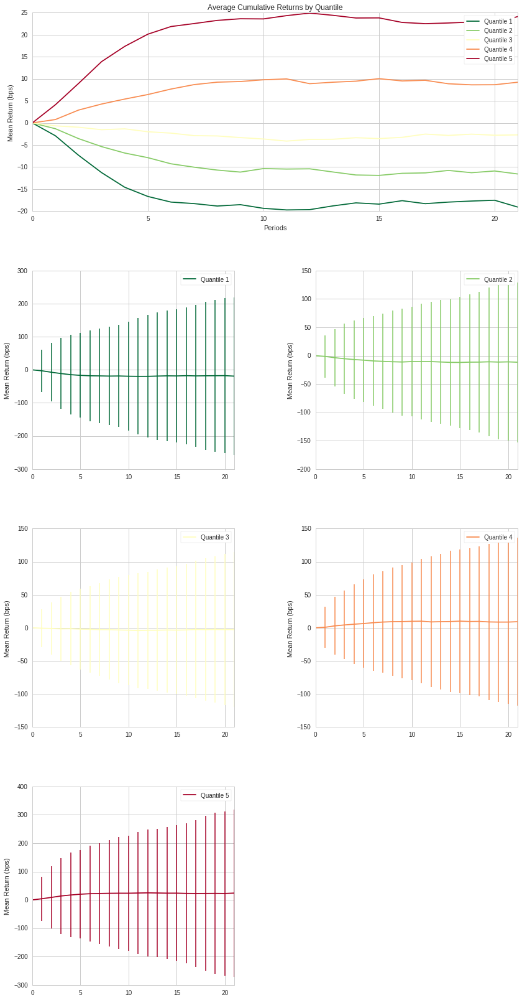

In [14]:
al.tears.create_event_returns_tear_sheet(factor_data_5a,
                                         pricing, 
                                         avgretplot=(0,21),
                                         long_short=True,
                                         by_group=False)

### Evaluate Extreme Tail Cases 

To look at some of the extreme tail cases, we can adjust the quantile settings. This will basically set the highest and lowest quantile to only hold 10% of the securities each.

In the below tearsheet, it looks as though the top minus bottom quantile performance metrics improve. However, I would treat this skeptically. It appears as a large part of that outperformance came in 2009. Not surprisingly, the top minus bottom performance is the greatest in the Financial sector. 

In [15]:
# Create a tearsheet to analyze the tailcases
factor_data_5b = al.utils.get_clean_factor_and_forward_returns(factor=result['Rank_5'],
                                                            prices=pricing,
                                                            groupby=result['sector_code'],
                                                            by_group=False,
                                                            groupby_labels=MORNINGSTAR_SECTOR_CODES,
                                                            quantiles=[0.,.1,.5,.9, 1.],
                                                            periods=(1,5,10))

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,1.0,52.0,25.528792,14.452524,113401,10.036828
2,51.0,253.0,150.416723,57.658326,452072,40.011718
3,247.0,450.5,349.908281,57.520816,450985,39.915511
4,445.0,500.0,474.522184,14.483614,113391,10.035943


Returns Analysis


,1,5,10
Ann. alpha,0.062,0.066,0.037
beta,0.090,0.087,0.071
Mean Period Wise Return Top Quantile (bps),6.206,23.964,26.600
Mean Period Wise Return Bottom Quantile (bps),-4.688,-19.567,-20.927
Mean Period Wise Spread (bps),10.897,8.550,4.583


Information Analysis


,1,5,10
IC Mean,0.011,0.025,0.019
IC Std.,0.163,0.157,0.150
t-stat(IC),3.142,7.723,6.024
p-value(IC),0.002,0.000,0.000
IC Skew,0.141,0.230,0.260
IC Kurtosis,0.661,0.710,0.388
Ann. IR,1.047,2.574,2.008


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.398,0.878,0.872
Quantile 2 Mean Turnover,0.334,0.596,0.593
Quantile 3 Mean Turnover,0.333,0.599,0.599
Quantile 4 Mean Turnover,0.395,0.861,0.854


,1,5,10
Mean Factor Rank Autocorrelation,0.76,-0.026,-0.006


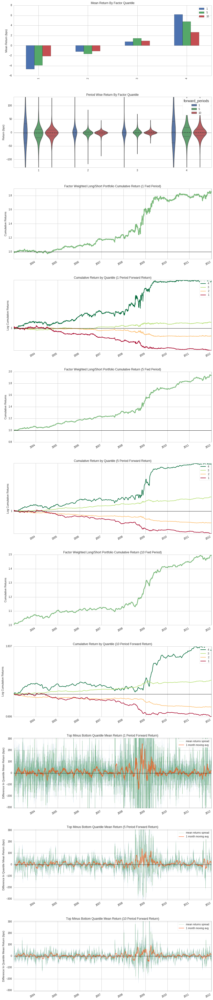

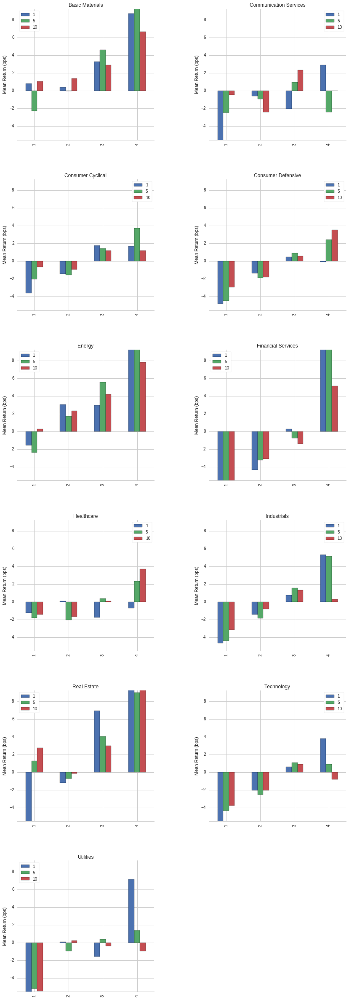

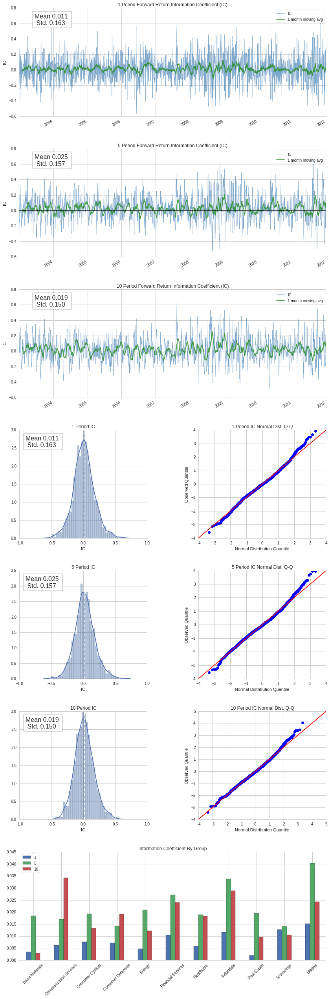

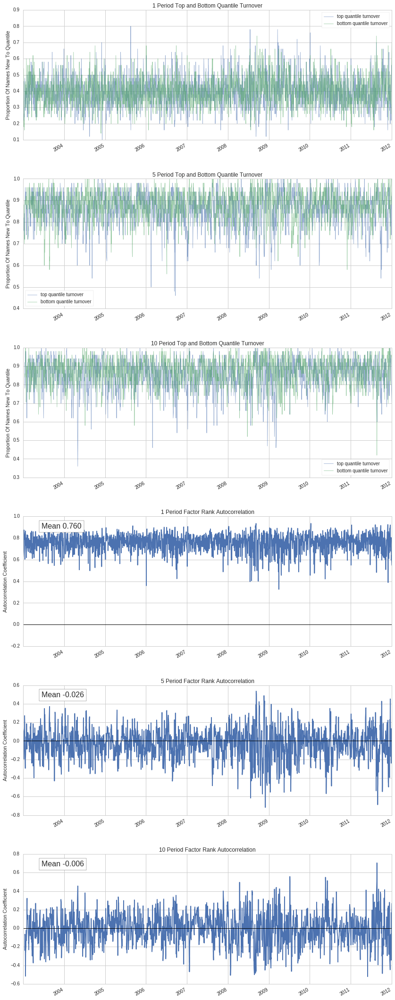

In [16]:
al.tears.create_full_tear_sheet(factor_data_5b,
                                by_group=True,
                                long_short=True)

## b) Evaluate the 1-month mean reversion factor

In [17]:
factor_data_21 = al.utils.get_clean_factor_and_forward_returns(factor=result['Rank_21'],
                                                            prices=pricing,
                                                            groupby=result['sector_code'],
                                                            by_group=False,
                                                            groupby_labels=MORNINGSTAR_SECTOR_CODES,
                                                            quantiles=5,
                                                            periods=(5,10, 21, 42))

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,1.0,104.0,50.667300,28.912031,223482,20.085670
2,99.0,205.0,150.579620,28.803115,222099,19.961371
3,196.0,303.0,250.319886,28.839641,222023,19.954541
4,294.0,401.0,350.098434,28.811652,222093,19.960832
5,395.0,500.0,449.751461,28.776400,222947,20.037586


Returns Analysis


,5,10,21,42
Ann. alpha,0.010,-0.003,-0.005,0.000
beta,0.144,0.139,0.143,0.158
Mean Period Wise Return Top Quantile (bps),8.630,9.067,15.314,54.163
Mean Period Wise Return Bottom Quantile (bps),-6.074,-5.421,-6.620,-26.482
Mean Period Wise Spread (bps),2.835,1.331,0.940,1.769


/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:727: FutureWarning: pd.rolling_apply is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,min_periods=1,window=21).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:767: FutureWarning: pd.rolling_apply is deprecated for DataFrame and will be removed in a future version, replace with 
	DataFrame.rolling(center=False,min_periods=1,window=21).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:727: FutureWarning: pd.rolling_apply is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,min_periods=1,window=42).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/

Information Analysis


,5,10,21,42
IC Mean,0.008,0.005,0.006,0.017
IC Std.,0.163,0.154,0.154,0.147
t-stat(IC),2.402,1.544,1.794,5.393
p-value(IC),0.016,0.123,0.073,0.000
IC Skew,0.166,0.264,0.243,0.042
IC Kurtosis,0.540,0.301,0.583,0.170
Ann. IR,0.805,0.517,0.601,1.807


Turnover Analysis


,5,10,21,42
Quantile 1 Mean Turnover,0.384,0.547,0.795,0.792
Quantile 2 Mean Turnover,0.629,0.722,0.793,0.800
Quantile 3 Mean Turnover,0.664,0.743,0.786,0.786
Quantile 4 Mean Turnover,0.621,0.717,0.798,0.800
Quantile 5 Mean Turnover,0.374,0.530,0.774,0.787


,5,10,21,42
Mean Factor Rank Autocorrelation,0.721,0.484,-0.008,-0.017


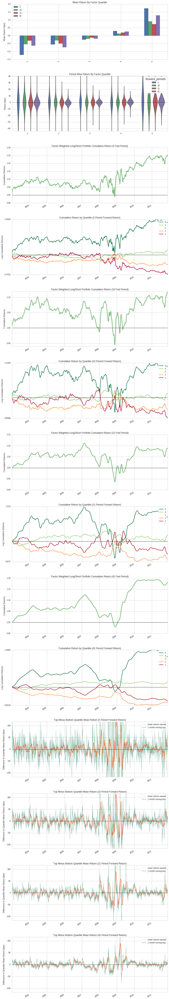

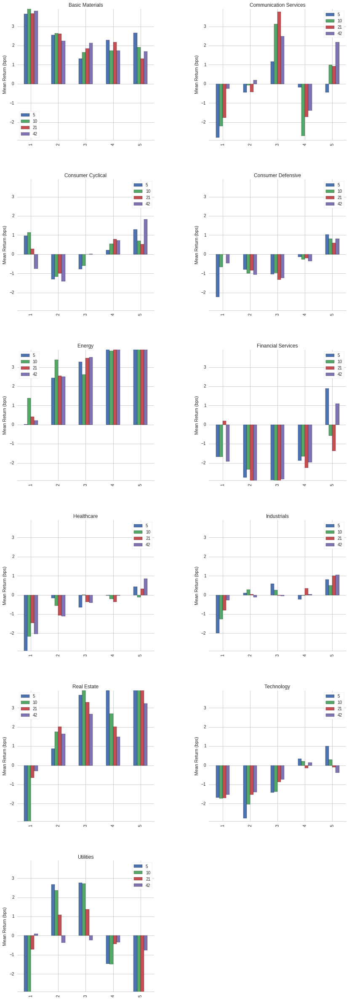

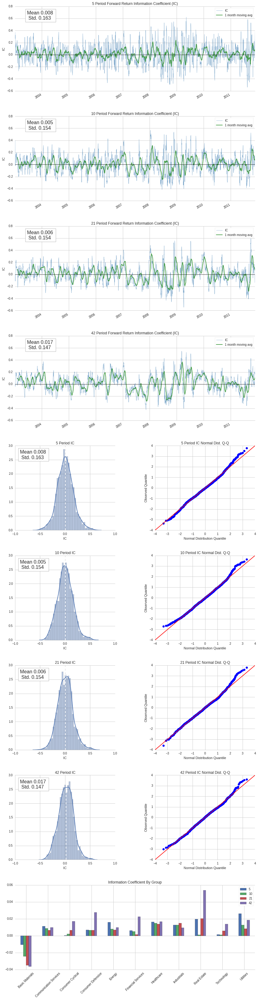

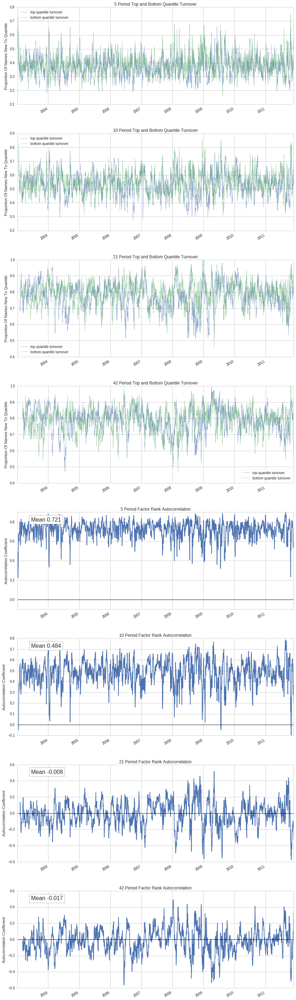

In [18]:
al.tears.create_full_tear_sheet(factor_data_21,
                                by_group=True,
                                long_short=True)

#### Example setting long_short flag to False

*Note: Despite setting this to False, the annualized alpha and beta are still calculated based on a long-short portfolio. I have submitted an issue for comment on Github to eventually work on changing this so that the alpha/beta regression is run on a long-only portfolio. *

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,1.0,104.0,50.667300,28.912031,223482,20.085670
2,99.0,205.0,150.579620,28.803115,222099,19.961371
3,196.0,303.0,250.319886,28.839641,222023,19.954541
4,294.0,401.0,350.098434,28.811652,222093,19.960832
5,395.0,500.0,449.751461,28.776400,222947,20.037586


Returns Analysis


,5,10,21,42
Ann. alpha,0.010,-0.003,-0.005,0.000
beta,0.144,0.139,0.143,0.158
Mean Period Wise Return Top Quantile (bps),32.353,54.146,110.543,259.605
Mean Period Wise Return Bottom Quantile (bps),17.708,39.739,88.660,178.894
Mean Period Wise Spread (bps),2.192,0.680,0.227,1.010


Information Analysis


,5,10,21,42
IC Mean,0.008,0.005,0.006,0.017
IC Std.,0.163,0.154,0.154,0.147
t-stat(IC),2.402,1.544,1.794,5.393
p-value(IC),0.016,0.123,0.073,0.000
IC Skew,0.166,0.264,0.243,0.042
IC Kurtosis,0.540,0.301,0.583,0.170
Ann. IR,0.805,0.517,0.601,1.807


Turnover Analysis


,5,10,21,42
Quantile 1 Mean Turnover,0.384,0.547,0.795,0.792
Quantile 2 Mean Turnover,0.629,0.722,0.793,0.800
Quantile 3 Mean Turnover,0.664,0.743,0.786,0.786
Quantile 4 Mean Turnover,0.621,0.717,0.798,0.800
Quantile 5 Mean Turnover,0.374,0.530,0.774,0.787


,5,10,21,42
Mean Factor Rank Autocorrelation,0.721,0.484,-0.008,-0.017


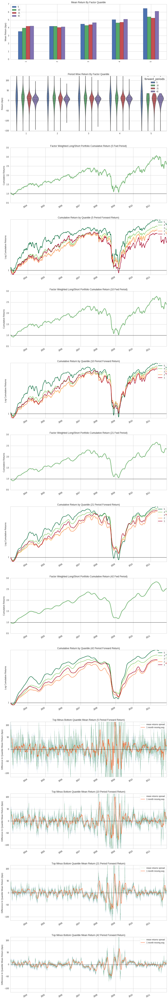

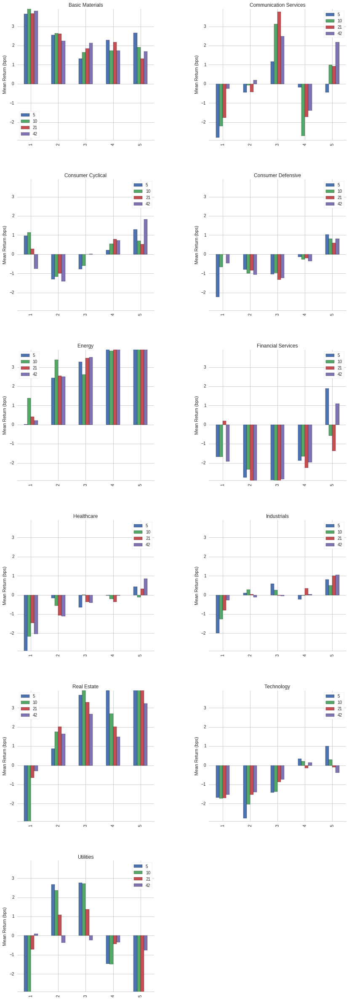

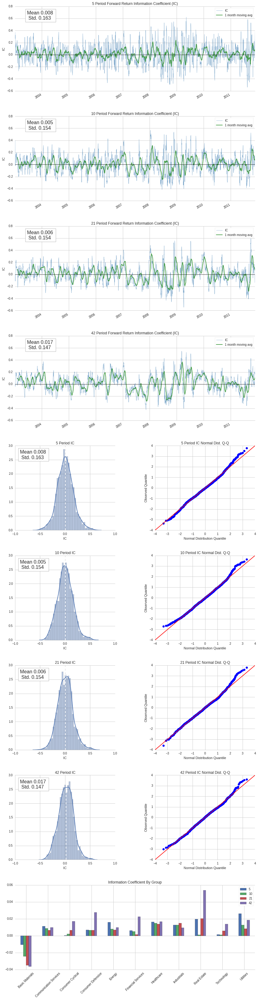

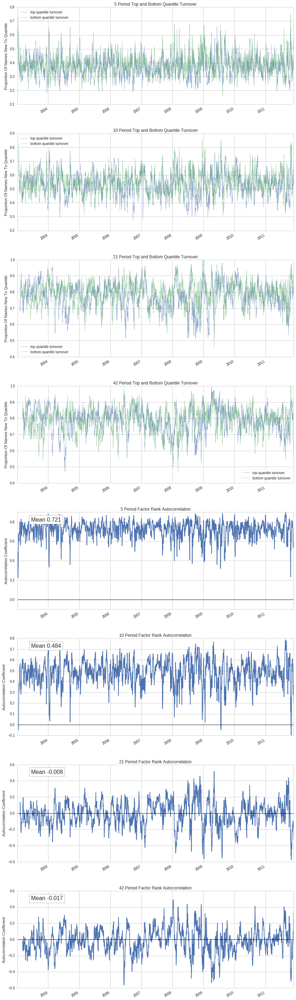

In [19]:
al.tears.create_full_tear_sheet(factor_data_21,
                                by_group=True,
                                long_short=False)

### Comments

#### 1-Week Mean Reversion
This factor performed very well over the time period. Excess returns were spread out over quantiles, sector groups, and time. The factor seemed to be predictive up to 5 days. Unsurprisingly, the turnover for this factor is quite high. Therefore, it is likely to incur significant transaction costs with some capacity constraints.

This factor seems to at least warrant additional evaluation. 

#### 1-Month Mean Reversion
The predictive ability of this factor was questionable at best. Factor-weighted alpha was practically 0. While it did appear that higher ranked quantiles outperformed, this could be explained by its market exposure/nonzero beta (~.14). For some reason, even this long-short portfolio has some market exposure, which is not ideal. Additionally, there are long stretches of outperformance followed by long stretches of flat/under performance.

Some possible reasons for the poor performance of this factor relative to the research:
1. Predictive ability has been arbitraged away by market participants.
2. Our universe may have been more restrictive, including only the most liquid stocks. The mean reversion effect may exist in less liquid names (and therefore, might not be exploitable).



## Evaluate 1-Week Mean Reversion Out-of-Sample

In [20]:
start_date = '2012-01-01' 
end_date = '2017-07-01'

# Run Pipeline in chunks
result_out_of_sample = run_pipe_in_chunks(make_pipeline(), 
                            start_date, 
                            end_date, 
                            weeks=26, days=0)

Running Pipeline for 2012-01-01 00:00:00 to 2012-07-01 00:00:00
Running Pipeline for 2012-07-03 00:00:00 to 2013-01-01 00:00:00
Running Pipeline for 2013-01-03 00:00:00 to 2013-07-04 00:00:00
Running Pipeline for 2013-07-06 00:00:00 to 2014-01-04 00:00:00
Running Pipeline for 2014-01-07 00:00:00 to 2014-07-08 00:00:00
Running Pipeline for 2014-07-09 00:00:00 to 2015-01-07 00:00:00
Running Pipeline for 2015-01-08 00:00:00 to 2015-07-09 00:00:00
Running Pipeline for 2015-07-10 00:00:00 to 2016-01-08 00:00:00
Running Pipeline for 2016-01-09 00:00:00 to 2016-07-09 00:00:00
Running Pipeline for 2016-07-12 00:00:00 to 2017-01-10 00:00:00
Running Pipeline for 2017-01-11 00:00:00 to 2017-07-01 00:00:00
Pipeline Computations Complete


In [21]:
# Get Pricing for assets in the Pipeline DataFrame
assets = result_out_of_sample.index.levels[1].unique()

# Set the number of additional days for which to fetch pricing data
FORWARD_DAYS = 15

# Fetch pricing data
pricing = get_pricing(assets, start_date, 
                      pd.Timestamp(end_date) + pd.Timedelta(days=FORWARD_DAYS),
                      fields="open_price")  

In [22]:
result_out_of_sample.head()

Rank_21  Rank_5  Return_21  \
2012-01-03 00:00:00+00:00 Equity(2 [ARNC])     478.0   463.0  -0.134134   
                          Equity(24 [AAPL])     61.0    75.0   0.060294   
                          Equity(62 [ABT])     152.0   129.0   0.030637   
                          Equity(67 [ADSK])    458.0   315.0  -0.109513   
                          Equity(88 [ACI])     462.0   481.0  -0.114233   

                                             Return_5  sector_code  
2012-01-03 00:00:00+00:00 Equity(2 [ARNC])  -0.028636          101  
                          Equity(24 [AAPL])  0.016363          311  
                          Equity(62 [ABT])   0.010068          206  
                          Equity(67 [ADSK]) -0.004595          311  
                          Equity(88 [ACI])  -0.042272          101

In [23]:
factor_data_5o = al.utils.get_clean_factor_and_forward_returns(factor=result_out_of_sample['Rank_5'],
                                                               prices=pricing,
                                                               groupby=result_out_of_sample['sector_code'],
                                                               by_group=False,
                                                               groupby_labels=MORNINGSTAR_SECTOR_CODES,
                                                               quantiles=5,
                                                               periods=(1,5,10))

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,1.0,103.0,50.546338,28.897148,138160,20.056150
2,100.0,202.0,150.486093,28.801095,137591,19.973551
3,199.0,301.0,250.186966,28.774530,137466,19.955405
4,298.0,400.5,349.873367,28.799018,137590,19.973406
5,397.0,500.0,449.736406,28.878451,138059,20.041488


Returns Analysis


,1,5,10
Ann. alpha,0.001,0.001,-0.006
beta,0.110,0.108,0.096
Mean Period Wise Return Top Quantile (bps),0.471,0.079,-4.607
Mean Period Wise Return Bottom Quantile (bps),-1.164,-6.816,-10.858
Mean Period Wise Spread (bps),1.645,1.344,0.597


Information Analysis


,1,5,10
IC Mean,0.005,0.006,0.004
IC Std.,0.147,0.145,0.136
t-stat(IC),1.208,1.500,1.211
p-value(IC),0.227,0.134,0.226
IC Skew,0.020,0.101,0.085
IC Kurtosis,0.789,1.008,0.804
Ann. IR,0.516,0.640,0.517


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.338,0.784,0.784
Quantile 2 Mean Turnover,0.586,0.789,0.789
Quantile 3 Mean Turnover,0.628,0.774,0.778
Quantile 4 Mean Turnover,0.582,0.791,0.793
Quantile 5 Mean Turnover,0.331,0.760,0.758


,1,5,10
Mean Factor Rank Autocorrelation,0.755,-0.012,0.0


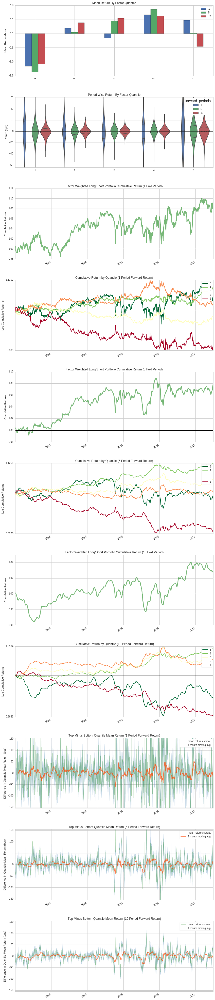

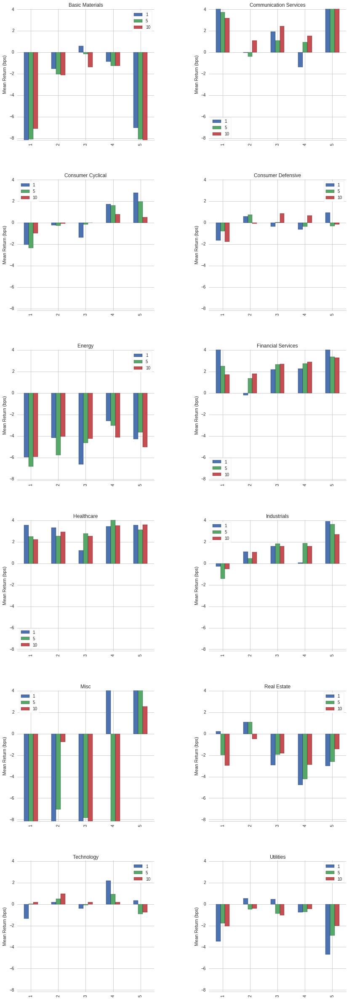

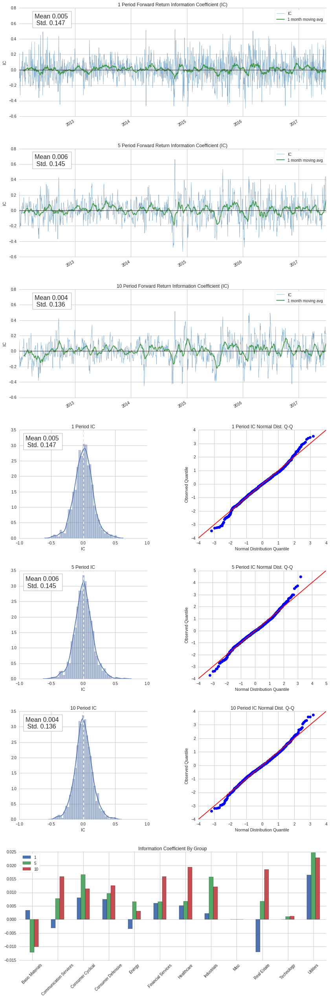

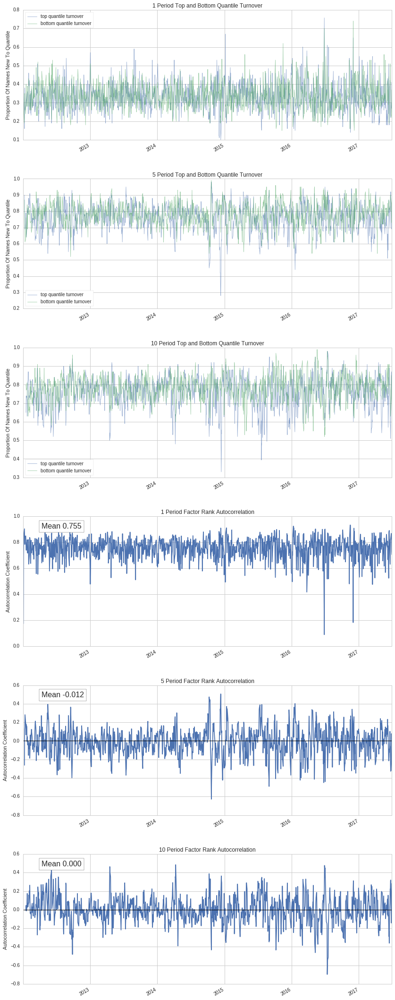

In [24]:
al.tears.create_full_tear_sheet(factor_data_5o,
                                by_group=True,
                                long_short=True)

## Comments

There was a large deterioration in the performance of the over the more recent time period. Again, this might suggest it was an edge that was arbitraged away. The factor might not perform as well in the recent low volatility environment that we have experienced as well. 